# Coordinate Descent Algorithm Implementation
This notebook implements coordinate descent optimization algorithms using Python.

In [51]:
# Import required libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
from matplotlib import animation
from IPython.display import HTML, Image

%matplotlib inline

In [52]:
def costfunction(X,y,theta):
    #Initialisation of useful values 
    m = np.size(y)
    
    #Cost function in vectorized form
    h = X @ theta
    J = float((1./(2*m)) * (h - y).T @ (h - y))    
    return J


def coordinate_descent(theta,X,y,alpha = .03, num_iters=20):
    '''Coordinate gradient descent for linear regression'''
    #Initialisation of useful values 
    m,n = X.shape
    J_history = []
    theta_0_hist, theta_1_hist = [], [] #For plotting afterwards
    
    
    for i in range(num_iters):
        
        for j in range(n):
            #Coordinate descent in vectorized form
            h = X @ theta 
            gradient =  (X[:,j] @ (h-y))
            theta[j] = theta[j] - alpha * gradient
            
            #Saving values for plots
            J_history.append(costfunction(X,y,theta))
            theta_0_hist.append(theta[0,0])
            theta_1_hist.append(theta[1,0])
                       
    return theta, J_history, theta_0_hist, theta_1_hist

def coordinate_descent_norm(theta,X,y,alpha = .03, num_iters=100):
    '''Coordinate gradient descent for linear regression - for normalized data'''
    #Initialisation of useful values 
    m,n = X.shape
    X = X / (np.linalg.norm(X,axis = 0)) #normalizing X
    J_history = []
    theta_0_hist, theta_1_hist = [], [] #For plotting afterwards
    
    
    for i in range(num_iters):
        
        for j in range(n):
            #Coordinate descent in vectorized form
            h = (X[:,0:j] @ theta[0:j]) + (X[:,j+1:] @ theta[j+1:])
            theta[j] =  (X[:,j] @ (y - h))
            
            #Saving values for plots
            J_history.append(costfunction(X,y,theta))
            theta_0_hist.append(theta[0,0])
            theta_1_hist.append(theta[1,0])
                       
    return theta, J_history, theta_0_hist, theta_1_hist

/var/folders/jr/44vrz9zd5797644v4xkf0my40000gn/T/ipykernel_29036/2136713463.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  J = float((1./(2*m)) * (h - y).T @ (h - y))
/var/folders/jr/44vrz9zd5797644v4xkf0my40000gn/T/ipykernel_29036/3292181622.py:74: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
/var/folders/jr/44vrz9zd5797644v4xkf0my40000gn/T/ipykernel_29036/3292181622.py:76: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


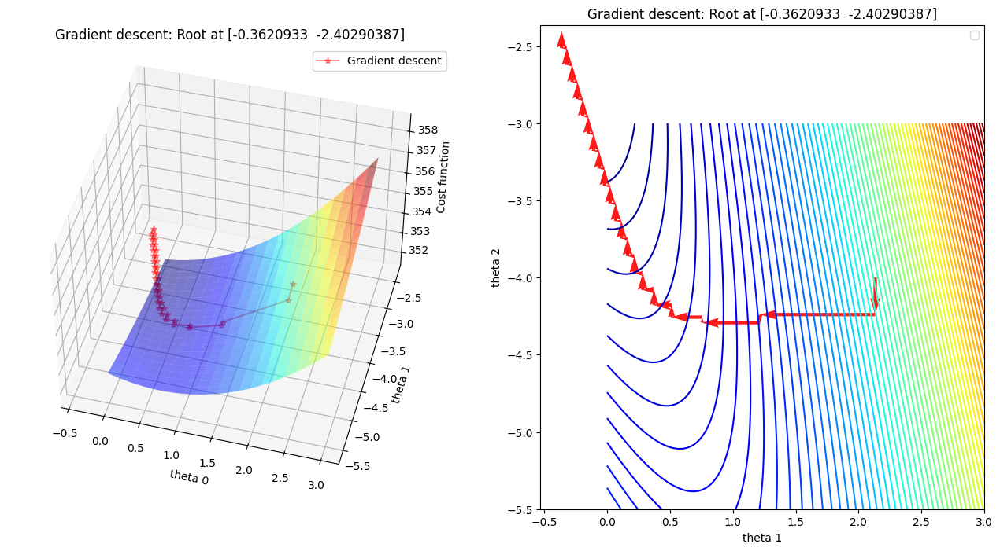

In [ ]:
def create_synthetic_data(num_samples=40, noise_factor=1.0, func_scale=1.5):
    """Creates a synthetic dataset with configurable parameters."""
    x = np.linspace(0, 1, num_samples)
    noise = noise_factor * np.random.uniform(size=num_samples)
    y = np.sin(x * func_scale * np.pi ) 
    y_noise = (y + noise).reshape(-1,1)
    
    # Mean-center the target variable
    y_noise = y_noise - y_noise.mean()
    
    # Features are f1 = 2*x and f2 = x**2
    X = np.vstack((2*x, x**2)).T
    
    # Ensure X is non-negative by shifting 
    min_x = np.min(X)
    if min_x < 0:
        X = X + (-min_x) 
        
    return X, y_noise

# --- Configuration ---
NUM_SAMPLES = 40
NOISE_LEVEL = 100.0
SIN_SCALE = 1.5
initial_theta = np.array([4,-4.]).reshape(-1,1) 

# --- Create Data ---
X, y_noise = create_synthetic_data(
    num_samples=NUM_SAMPLES,
    noise_factor=NOISE_LEVEL,
    func_scale=SIN_SCALE
)

#Setup of meshgrid of theta values
T0, T1 = np.meshgrid(np.linspace(0,3,100),np.linspace(-5.5,-3,100))

#Computing the cost function for each theta combination
zs = np.array(  [costfunction(X, y_noise.reshape(-1,1),np.array([t0,t1]).reshape(-1,1)) 
                     for t0, t1 in zip(np.ravel(T0), np.ravel(T1)) ] )
#Reshaping the cost values    
Z = zs.reshape(T0.shape)


#Computing the gradient descent
theta_result_c,J_history_c, theta_0_c, theta_1_c = coordinate_descent(initial_theta,X,y_noise, alpha = .009) 

#Angles needed for quiver plot
anglesx = np.array(theta_0_c)[1:] - np.array(theta_0_c)[:-1]
anglesy = np.array(theta_1_c)[1:] - np.array(theta_1_c)[:-1]

%matplotlib inline
fig = plt.figure(figsize = (16,8))

#Surface plot
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_surface(T0, T1, Z, rstride = 5, cstride = 5, cmap = 'jet', alpha=0.5)
ax.plot(theta_0_c,theta_1_c,J_history_c, marker = '*', color = 'r', alpha = .4, label = 'Gradient descent')

ax.set_xlabel('theta 0')
ax.set_ylabel('theta 1')
ax.set_zlabel('Cost function')
ax.set_title('Gradient descent: Root at {}'.format(theta_result_c.ravel()))
ax.view_init(45, -75)
ax.legend()


#Contour plot
ax = fig.add_subplot(1, 2, 2)
ax.contour(T0, T1, Z, 70, cmap = 'jet')
ax.quiver(theta_0_c[:-1], theta_1_c[:-1], anglesx, anglesy, scale_units = 'xy', angles = 'xy', scale = 1, color = 'r', alpha = .9)
ax.set_xlabel('theta 1')
ax.set_ylabel('theta 2')
ax.set_title('Gradient descent: Root at {}'.format(theta_result_c.ravel()))
ax.legend()

plt.legend()
plt.show()

Closed form solution
Note that coordinate descent does not converge as the number of steps is too small. We have limited the reduce the size of the animation.

In [54]:
np.linalg.inv(X.T@X) @X.T @ y_noise

array([[-9.97862172],
       [22.69429119]])

Animation of the coordinate descent

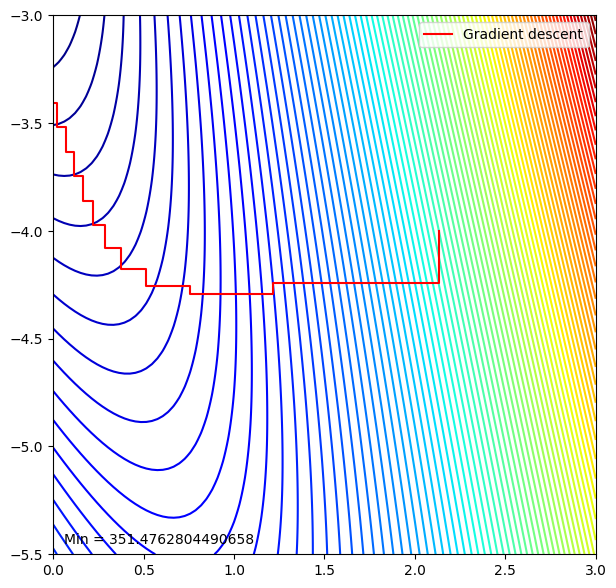

In [55]:
#Plot the contour
fig1, ax1 = plt.subplots(figsize = (7,7))
ax1.contour(T0, T1, Z, 100, cmap = 'jet')

#theta_result_c,J_history_c, theta_0_c, theta_1_c

# Create animation
line, = ax1.plot([], [], 'r', label = 'Gradient descent', lw = 1.5)
point, = ax1.plot([], [], '*', color = 'red', markersize = 4)
value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)

def init_1():
    line.set_data([], [])
    point.set_data([], [])
    value_display.set_text('')

    return line, point, value_display

def animate_1(i):
    # Animate line
    line.set_data(theta_0_c[:i], theta_1_c[:i])
    
    # Animate points
    point.set_data([theta_0_c[i]], [theta_1_c[i]])

    # Animate value display
    value_display.set_text('Min = ' + str(J_history_c[i]))

    return line, point, value_display

ax1.legend(loc = 1)

anim1 = animation.FuncAnimation(fig1, animate_1, init_func=init_1,
                               frames=len(theta_0_c), interval=100, 
                               repeat_delay=60, blit=True)
#plt.show()
HTML(anim1.to_jshtml())